In [ ]:
%pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [ ]:
!unzip dataset/limones.zip -d dataset/limones
!unzip dataset/sandias.zip -d dataset/sandias
!unzip dataset/fresas.zip -d dataset/fresas
!unzip dataset/duraznos.zip -d dataset/duraznos

In [16]:
!rm -rf dataset/limones.zip
!rm -rf dataset/sandias.zip
!rm -rf dataset/fresas.zip
!rm -rf dataset/duraznos.zip

# Clasificador de Imagenes con Learning Transfer

In [2]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from PIL import Image
import cv2
import tensorflow as tf
import tensorflow_hub as hub
import os
import matplotlib.pyplot as plt

In [12]:
#Crear el dataset generador
datagen = ImageDataGenerator(
    rescale=1. / 255,
    rotation_range = 10,
    width_shift_range=0.15,
    height_shift_range = 0.15,
    shear_range = 5,
    zoom_range = [0.7, 1.3],
    validation_split = 0.2
)

data_gen_entrenamiento = datagen.flow_from_directory("dataset",
                                                     target_size=(224,224),
                                                     batch_size=32, shuffle=True,
                                                     subset="training")

data_gen_pruebas = datagen.flow_from_directory("dataset",
                                                     target_size=(224,224),
                                                     batch_size=32, shuffle=True,
                                                     subset="validation")


Found 1466 images belonging to 5 classes.
Found 363 images belonging to 5 classes.


In [ ]:
# Nombres y cantidad de categorias
categorias = {v: k for k, v in data_gen_entrenamiento.class_indices.items()}
num_cat = len(categorias)

# Función para obtener el nombre de la categoría
def obtener_categoria(etiqueta_one_hot):
    
    indice = np.argmax(etiqueta_one_hot)
    
    return categorias.get(indice, "Categoría desconocida")

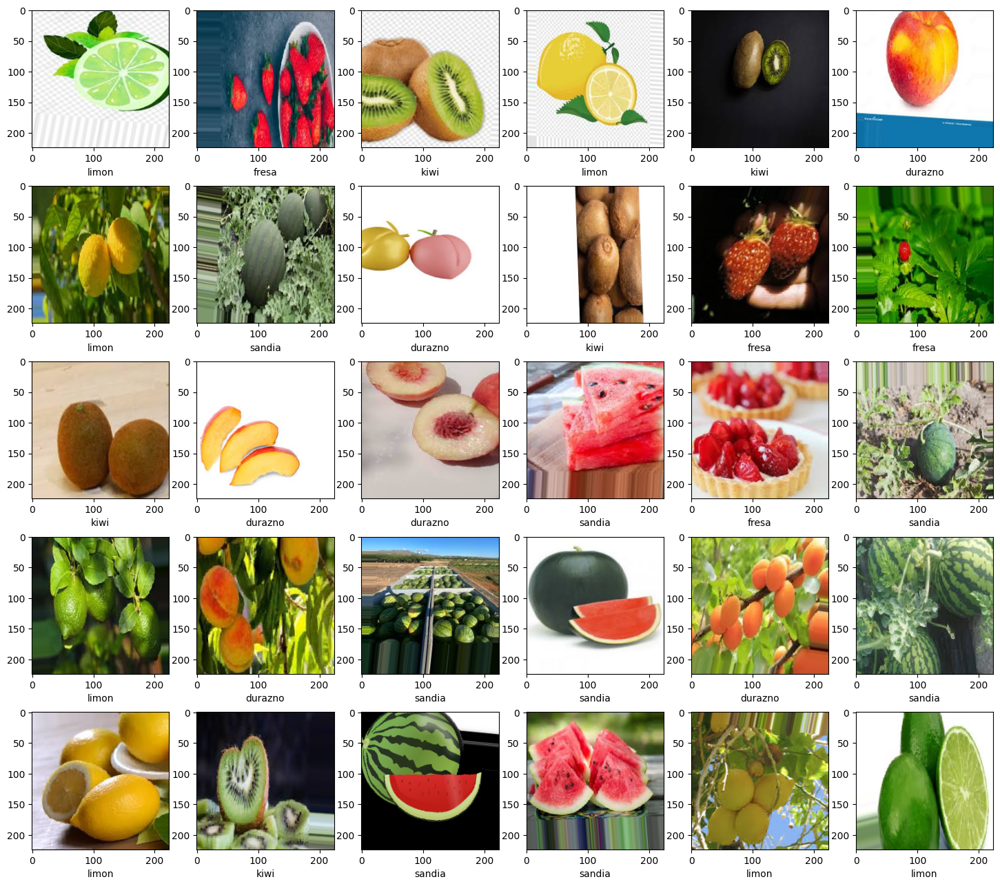

In [14]:
# Grafica imagenes de muestra
plt.figure(figsize=(18, 16))
for imagenes, etiquetas in data_gen_entrenamiento:
  for i in range(30):
    plt.subplot(5, 6, i+1)
    plt.xlabel(obtener_categoria(etiquetas[i]))
    plt.imshow(imagenes[i])
  break
plt.show()

In [15]:
# Descarga de la red preentrenada
url ="https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"
mobilenetv2 = hub.KerasLayer(url, input_shape=(224, 224, 3))

#Congelar las capas
mobilenetv2.trainable = False

In [22]:
# Creacion de la red neuronal
modelo = tf.keras.Sequential([
    mobilenetv2,
    tf.keras.layers.Dense(num_cat, activation="softmax")
])

modelo.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

In [ ]:
# Entrenamiento del modelo
EPOCAS = 20
entrenamiento = modelo.fit(
    data_gen_entrenamiento, epochs=EPOCAS, batch_size=32,
    validation_data=data_gen_pruebas
)

Epoch 1/20



 2/46 [>.............................] - ETA: 40s - loss: 1.8921 - accuracy: 0.1875 

C:\Users\Carolina\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\PIL\Image.py:1045: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


46/46 [==============================] - 67s 1s/step - loss: 0.9162 - accuracy: 0.6514 - val_loss: 0.3948 - val_accuracy: 0.8981
Epoch 2/20
46/46 [==============================] - 31s 669ms/step - loss: 0.3462 - accuracy: 0.9018 - val_loss: 0.2297 - val_accuracy: 0.9477
Epoch 3/20
46/46 [==============================] - 30s 662ms/step - loss: 0.2531 - accuracy: 0.9284 - val_loss: 0.1895 - val_accuracy: 0.9532
Epoch 4/20
46/46 [==============================] - 30s 661ms/step - loss: 0.2054 - accuracy: 0.9447 - val_loss: 0.1497 - val_accuracy: 0.9559
Epoch 5/20
46/46 [==============================] - 31s 672ms/step - loss: 0.1687 - accuracy: 0.9591 - val_loss: 0.1467 - val_accuracy: 0.9532
Epoch 6/20
46/46 [==============================] - 30s 660ms/step - loss: 0.1486 - accuracy: 0.9618 - val_loss: 0.1467 - val_accuracy: 0.9642
Epoch 7/20
46/46 [==============================] - 29s 625ms/step - loss: 0.1340 - accuracy: 0.9666 - val_loss: 0.1126 - val_accuracy: 0.9725
Epoch 8/20
46

In [25]:
# Funcion para categorizar imagenes nuevas
def categorizar(ruta):
  img = Image.open(ruta)
  img = img.convert("RGB")
  img = np.array(img).astype(float)/255

  img = cv2.resize(img, (224, 224))
  prediccion = modelo.predict(img.reshape(-1, 224, 224, 3))
  plt.imshow(img)
  plt.xlabel(obtener_categoria(prediccion))

1/1 [==============================] - 0s 70ms/step


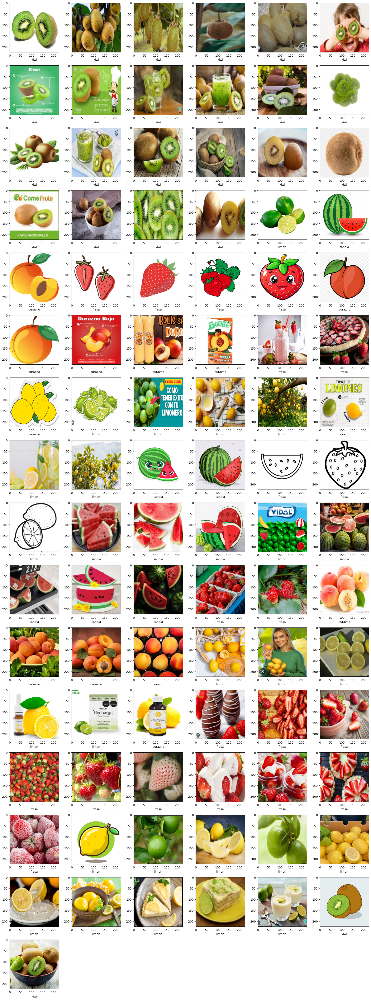

In [ ]:
carpeta = "test"
imagenes = [os.path.join(carpeta, archivo) for archivo in os.listdir(carpeta) if archivo.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

# Calcular el número de filas y columnas necesarios
num_imagenes = len(imagenes)
cols = 6  # Número fijo de columnas (puedes ajustarlo si lo deseas)
rows = (num_imagenes // cols) + (1 if num_imagenes % cols != 0 else 0)  # Número de filas necesarias

plt.figure(figsize=(cols * 3, rows * 3))  # Ajustar el tamaño de la figura según el número de imágenes

# Graficar todas las imágenes
for i, archivo in enumerate(imagenes):
    plt.subplot(rows, cols, i + 1)
    categorizar(archivo)

plt.tight_layout()  # Ajustar el layout para evitar solapamientos
plt.show()

print(f'Imagenes de prueba: {num_imagenes}')